# AlexNet & ResNet for Music Genre Classification
Dekun Xie

## Reference
[1] Krizhevsky, A., Sutskever, I., & Hinton, G. E. (2012). Imagenet classification with deep convolutional neural networks. Advances in neural information processing systems, 25.

[2] He, K., Zhang, X., Ren, S., & Sun, J. (2016). Deep residual learning for image recognition. In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 770-778).

[3] Zhang, A., Lipton, Z. C., Li, M., & Smola, A. J. (2021). Dive into deep learning. arXiv preprint arXiv:2106.11342.

In [1]:
import torch
from torch import nn
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import csv
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
import os

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# 01 Plot Spectrogram

(64, 668)


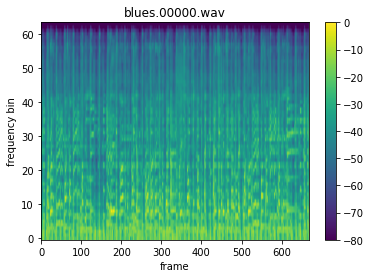

In [2]:
# Plot Example
# play audio
file_name = './Data/genres_original/blues/blues.00000.wav'
audio, sr = librosa.load(file_name, 22050)
ipd.display(ipd.Audio(audio, rate=sr))
melspectrogram = librosa.feature.melspectrogram(audio, sr, n_mels=64, n_fft=2048, win_length=int(0.09*sr), hop_length=int(0.045*sr))
plt.title('blues.00000.wav')
plt.xlabel('frame')
plt.ylabel('frequency bin')
plt.imshow(librosa.power_to_db(melspectrogram, ref=np.max), aspect='auto', origin='lower')
print(melspectrogram.shape)
plt.colorbar()

<DirEntry 'blues.00000.wav'>


<DirEntry 'classical.00000.wav'>


<DirEntry 'country.00000.wav'>


<DirEntry 'disco.00000.wav'>


<DirEntry 'hiphop.00000.wav'>


<DirEntry 'jazz.00000.wav'>


<DirEntry 'metal.00000.wav'>


<DirEntry 'pop.00000.wav'>


<DirEntry 'reggae.00000.wav'>


<DirEntry 'rock.00000.wav'>


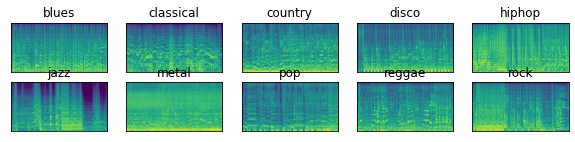

In [34]:
# Plot all audio
dir_path = './Data/genres_original'
files = []
plt.figure(figsize=(10, 2))

for i, entry in enumerate(os.scandir(dir_path)):
    for file_name in os.scandir(entry):
        files.append(file_name)
        print(file_name)
        audio, sr = librosa.load(file_name, 22050)
        ipd.display(ipd.Audio(audio, rate=sr))
        melspectrogram = librosa.feature.melspectrogram(audio, sr, n_mels=64, n_fft=2048, win_length=int(0.09*sr), hop_length=int(0.045*sr))
        plt.subplot(2,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.title(file_name.name.split('.')[0])
        # plt.xlabel('frame')
        # plt.ylabel('frequency bin')
        plt.imshow(librosa.power_to_db(melspectrogram, ref=np.max), aspect='auto', origin='lower')
        # print(melspectrogram.shape)
        # plt.colorbar()
        break

In [ ]:
def extract_melspectrogram(audiofilefolder, filename, label, win_len=0.09, hop_len=0.045, n_mels=64):
    audio, sr = librosa.load("%s/%s/%s" % (audiofilefolder, label, filename), sr=22050)
    win_len = int(win_len*sr)
    hop_len = int(hop_len*sr)
    spec = librosa.feature.melspectrogram(audio, sr, n_mels=n_mels, n_fft=2048, win_length=win_len, hop_length=hop_len)
    # return data format (time_len, n_mels)
    return spec.transpose((1,0))
def genre_to_number(genre):
    if genre == 'blues':
        return 0
    elif genre == 'classical':
        return 1
    elif genre == 'country':
        return 2
    elif genre == 'disco':
        return 3
    elif genre == 'hiphop':
        return 4
    elif genre == 'jazz':
        return 5
    elif genre == 'metal':
        return 6
    elif genre == 'pop':
        return 7
    elif genre == 'reggae':
        return 8
    elif genre == 'rock':
        return 9
def normalise(train_data, valid_data, test_data):
    train_data = torch.FloatTensor(train_data)
    valid_data = torch.FloatTensor(valid_data)
    test_data = torch.FloatTensor(test_data)

    mean = torch.mean(train_data,axis=0)
    std = torch.std(train_data,axis=0)

    norm_train = (train_data - mean) / std
    norm_valid = (valid_data - mean) / std
    norm_test = (test_data - mean) / std

    return norm_train, norm_valid, norm_test

# 02 Load Data

## Option 1: Load the raw data

In [ ]:
# # load labels
label_csv= './Data/features_30_sec.csv'
audiofilefolder = './Data/genres_original'

labels = dict()
with open(label_csv, 'r') as infp:
        rdr = csv.DictReader(infp)
        for row in rdr:
            labels[row['filename']] = row['label']

fkeys = sorted(labels.keys())
for kv in labels.items():
    print(kv)
    break

In [ ]:
data_lenght = len(labels)
data = np.zeros((data_lenght, 668, 64)) # for storing mel spectrograms
label = np.zeros((data_lenght,)) # for storing the annotion
for i, kv in enumerate(labels.items()):
    # if(kv[0]=='jazz.00054.wav'):
    #     continue
    print(f'{i}: {kv}')
    mel = extract_melspectrogram(audiofilefolder, kv[0], kv[1])
    if len(mel)>=668:
        data[i] = mel[:668] 
    else:
        data[i] = np.pad(mel, ((0, 668-len(mel)), (0,0)), 'constant')
    label[i] = genre_to_number(kv[1])

In [ ]:
def shuffle_data(data, label):
    # permute the data indices
    rand_ind = np.random.permutation(len(data))
    # re-order the data with the pumuted indices
    return data[rand_ind], label[rand_ind]

In [ ]:
'''
- Split the data into 
    training (80%)
    validation (10%)
    test (10%)
'''
data_len = len(data)
print(data_len)
shuffle_indexes = np.random.permutation(data_len)

train_indexes = shuffle_indexes[:int(0.8*data_len)]
valid_indexes = shuffle_indexes[int(0.8*data_len):int(0.9*data_len)]
test_indexes =shuffle_indexes[int(0.9*data_len):]


print(data_len)
# training data
train_data = torch.FloatTensor(data[train_indexes].reshape((-1, 1, 668, 64)))
torch.save(train_data, './Data/train_data')
train_label = torch.Tensor(label[train_indexes]).to(torch.int64)
torch.save(train_label, './Data/train_label')
print(train_data.shape)

# validation data
valid_data = torch.FloatTensor(data[valid_indexes].reshape((-1, 1, 668, 64)))
torch.save(valid_data, './Data/valid_data')
valid_label = torch.Tensor(label[valid_indexes]).to(torch.int64)
torch.save(valid_label, './Data/valid_label')
print(valid_data.shape)

# test data
test_data = torch.FloatTensor(data[test_indexes].reshape((-1, 1, 668, 64)))
torch.save(test_data, './Data/test_data')
test_label = torch.Tensor(label[test_indexes]).to(torch.int64)
torch.save(test_label, './Data/test_label')
print(test_data.shape)

## Option 2: Load the Saved Data

In [ ]:
train_data = torch.load('./Data/train_data')
train_label = torch.load('./Data/train_label')
print(train_data.shape)

# validation data
valid_data = torch.load('./Data/valid_data')
valid_label = torch.load('./Data/valid_label')
print(valid_data.shape)

# test data
test_data = torch.load('./Data/test_data')
test_label = torch.load('./Data/test_label')
print(test_data.shape)

train_data, valid_data, test_data = normalise(train_data, valid_data, test_data)



torch.Size([799, 1, 668, 64])
torch.Size([100, 1, 668, 64])
torch.Size([100, 1, 668, 64])


# 03 Train, Test and Evaluation

In [1]:
def train(model, saved_path, num_epochs, train_data, train_label, valid_data, valid_label, loss):
  
    epoch_loss = []
    epoch_accuracy = []
    best_valid_acc = 0.0

    for epoch in range(num_epochs):
        model.train()
        train_data, train_label = train_data.to(device), train_label.to(device)
    
        # the number of minibatch in one epoch
        num_batch = int(np.ceil(len(train_data) / batch_size)) # batch_size
        for i in range(num_batch):
            batch_data = train_data[i: i+batch_size]
            label_data = train_label[i: i+batch_size]

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = model(batch_data)
            # print('output',outputs)
            l = loss(outputs, label_data)
            l.backward()
            optimizer.step()

        running_loss = l.item()
        # print training loss
        print('[%d] loss: %.8f' %(epoch, running_loss))
        epoch_loss.append(running_loss)

        # evaluate the network on the validation data
        valid_pred = predict(model, valid_data.to(device))
        valid_acc = accuracy_score(valid_label, valid_pred)
        print('Validation accuracy: %g' % valid_acc)
        epoch_accuracy.append(valid_acc)
        # if the best validation performance so far, save the network to file 
        if(best_valid_acc < valid_acc):
            print('Saving best model')
            best_valid_acc = valid_acc
            torch.save(model.state_dict(), saved_path)
    return epoch_loss, epoch_accuracy

def init_weights(m):
    if type(m) == nn.Linear or type(m) == nn.Conv2d:
        nn.init.xavier_uniform_(m.weight)
def predict(model, data):
    pred = np.zeros(len(data)) # for storing predicted class labels, one for each data sample
    num_batch = len(data)//batch_size # number of batches in one data epoch
    # evaluate batch by batch and store the output to "pred"
    for i in range(num_batch):
        temp = model(data[i*num_batch : (i+1)*num_batch]).detach().cpu().numpy()
        for j in range(len(temp)):
            # print('run')
            pred[i*num_batch+j :] = temp.argmax()
    # some trailing data samples
    if(num_batch*batch_size < len(data)):
        temp = model(data[num_batch*batch_size :]).detach().cpu().numpy()
        for i in range(len(temp)):
        # print(temp[i])
            pred[num_batch*batch_size+i :] = temp[i].argmax()
    # each element in "pred" is the output after sigmoid function and has value in [0, 1].
    # to obtain the discrete label (0 or 1 in this case), we threshold the value by 0.5.
    # print(pred)
    return pred
def plot_loss_accuracy(epoch_loss, epoch_accuracy, num_epochs):
    plt.plot([x for x in range(num_epochs)], epoch_loss)
    plt.title('Loss for Epoch')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.show()
    plt.plot([x for x in range(num_epochs)], epoch_accuracy)
    plt.title('Valid Accuracy')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.show()

def evaluate(model, saved_model, test_data, test_label):
    model.load_state_dict(torch.load(saved_model))
    model.eval()
    model.to(device)

    # evaluate on the test data
    test_pred = predict(model, test_data.to(device)) 

    # test accuracy
    test_acc = accuracy_score(test_label, test_pred)
    print('Test accuracy: %g' % test_acc)

    pclass, rclass, fclass, support_micro = precision_recall_fscore_support(test_label, test_pred, labels=[0,1,2,3,4,5,6,7,8,9], average=None)
    print('Test precision:\n', pclass)
    print('Test recall:\n', rclass)
    print('Test f1:\n', fclass)

    # confusion matrix
    confusion = confusion_matrix(test_label, test_pred)
    plt.matshow(confusion)
    plt.show()
    print('Confusion_matrix\n',confusion)

# 3.1 AlexNet

In [ ]:
# ALEXNET
alexnet = nn.Sequential(
    nn.Conv2d(1, 96, kernel_size=(33,11), stride=4, padding=(0,80)), nn.ReLU(),
    nn.MaxPool2d(kernel_size=(9,3), stride=2),
    nn.Conv2d(96, 256, kernel_size=5, padding=2), nn.ReLU(),
    nn.MaxPool2d(kernel_size=(9,3), stride=2),
    nn.Conv2d(256, 384, kernel_size=(9,3), padding=1), nn.ReLU(),
    nn.Conv2d(384, 384, kernel_size=(9,3), padding=1), nn.ReLU(),
    nn.Conv2d(384, 256, kernel_size=(9,3), padding=1), nn.ReLU(),
    nn.MaxPool2d(kernel_size=3, stride=2), nn.Flatten(),
    nn.Linear(8960, 6400), nn.ReLU(), nn.Dropout(p=0.5),
    nn.Linear(6400, 4096), nn.ReLU(), nn.Dropout(p=0.5),
    nn.Linear(4096, 10),
)

alexnet.apply(init_weights)
alexnet.to(device)

num_epochs = 100
batch_size = 256
loss = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(alexnet.parameters(), lr=5e-4, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.)
# training
alexnet_model = './model/best_alexnet_model_normal' # path for saving the best model during training
alexnet_epoch_loss, alexnet_epoch_accuracy = train(alexnet, alexnet_model, num_epochs, train_data, train_label, valid_data, valid_label, loss)



[0] loss: 2.41739678
Validation accuracy: 0.13
Saving best model
[1] loss: 2.30366826
Validation accuracy: 0.08
[2] loss: 2.27279973
Validation accuracy: 0.04
[3] loss: 2.24635053
Validation accuracy: 0.16
Saving best model
[4] loss: 2.16987300
Validation accuracy: 0.16
[5] loss: 2.05259824
Validation accuracy: 0.14
[6] loss: 1.94233227
Validation accuracy: 0.19
Saving best model
[7] loss: 1.90577066
Validation accuracy: 0.17
[8] loss: 1.76561594
Validation accuracy: 0.21
Saving best model
[9] loss: 1.67688930
Validation accuracy: 0.28
Saving best model
[10] loss: 1.62144673
Validation accuracy: 0.23
[11] loss: 1.75673473
Validation accuracy: 0.3
Saving best model
[12] loss: 1.71669924
Validation accuracy: 0.25
[13] loss: 1.62820768
Validation accuracy: 0.3
[14] loss: 1.57134616
Validation accuracy: 0.34
Saving best model
[15] loss: 1.49131370
Validation accuracy: 0.36
Saving best model
[16] loss: 1.38514173
Validation accuracy: 0.31
[17] loss: 1.30826032
Validation accuracy: 0.28
[18]

Test accuracy: 0.42
Test precision:
 [0.42857143 0.66666667 0.42857143 0.42857143 0.25       0.57142857
 0.83333333 0.54545455 0.18181818 0.4       ]
Test recall:
 [0.4        0.66666667 0.33333333 0.42857143 0.2        0.5
 0.83333333 0.6        0.44444444 0.15384615]
Test f1:
 [0.4137931  0.66666667 0.375      0.42857143 0.22222222 0.53333333
 0.83333333 0.57142857 0.25806452 0.22222222]


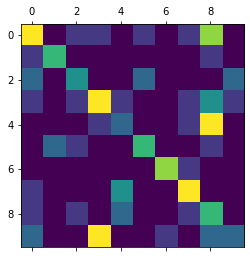

Confusion_matrix
 [[6 0 1 1 0 1 0 1 5 0]
 [1 4 0 0 0 0 0 0 1 0]
 [2 0 3 0 0 2 0 0 0 2]
 [1 0 1 6 1 0 0 1 3 1]
 [0 0 0 1 2 0 0 1 6 0]
 [0 2 1 0 0 4 0 0 1 0]
 [0 0 0 0 0 0 5 1 0 0]
 [1 0 0 0 3 0 0 6 0 0]
 [1 0 1 0 2 0 0 1 4 0]
 [2 0 0 6 0 0 1 0 2 2]]
Lowest Loss:0.0387263260781765 at epoch 95
Best Accuracy:0.48 at epoch 44


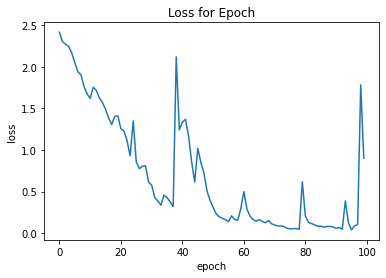

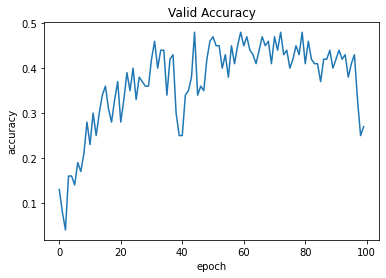

loss [2.4173967838287354, 2.303668260574341, 2.2727997303009033, 2.2463505268096924, 2.169872999191284, 2.052598237991333, 1.9423322677612305, 1.9057706594467163, 1.7656159400939941, 1.6768893003463745, 1.6214467287063599, 1.7567347288131714, 1.716699242591858, 1.6282076835632324, 1.5713461637496948, 1.4913136959075928, 1.3851417303085327, 1.3082603216171265, 1.4050811529159546, 1.4103013277053833, 1.2571159601211548, 1.2270550727844238, 1.1130595207214355, 0.9302279353141785, 1.3502461910247803, 0.8578678369522095, 0.7753587365150452, 0.8050491809844971, 0.811029314994812, 0.6138174533843994, 0.5774334669113159, 0.4300232529640198, 0.38757622241973877, 0.3371134102344513, 0.4565632939338684, 0.42892274260520935, 0.3765714764595032, 0.3189801871776581, 2.121351718902588, 1.2436400651931763, 1.3363232612609863, 1.3694531917572021, 1.1709067821502686, 0.859347403049469, 0.6142646074295044, 1.0205879211425781, 0.8515886664390564, 0.7248563766479492, 0.507172703742981, 0.39515990018844604,

In [ ]:
evaluate(alexnet, alexnet_model, test_data, test_label)
print(f'Lowest Loss:{np.min(alexnet_epoch_loss)} at epoch {np.argmin(alexnet_epoch_loss)}\nBest Accuracy:{np.max(alexnet_epoch_accuracy)} at epoch {np.argmax(alexnet_epoch_accuracy)}')
plot_loss_accuracy(alexnet_epoch_loss,alexnet_epoch_accuracy, num_epochs)
print('loss',alexnet_epoch_loss)
print('accuracy',alexnet_epoch_accuracy)

# 3.2 ResNet

In [ ]:
# ResNet
class Residual(nn.Module):
    def __init__(self, input_channels, num_channels, use_1x1conv=False, stride=1):
        super().__init__()
        self.conv1 = nn.Conv2d(input_channels, num_channels, 
                        kernel_size=3, padding=1, stride=stride)
        self.conv2 = nn.Conv2d(num_channels, num_channels, 
                        kernel_size=3, padding=1)
        if use_1x1conv:
            self.conv3 = nn.Conv2d(input_channels, num_channels, 
                       kernel_size=1, stride=stride)  
        else:
            self.conv3 = None
        self.bn1 = nn.BatchNorm2d(num_channels)
        self.bn2 = nn.BatchNorm2d(num_channels)
        self.ReLU = nn.ReLU(inplace=True) # inplace save memory
        
    def forward(self, X):
        Y = self.ReLU(self.bn1(self.conv1(X)))
        Y = self.bn2(self.conv2(Y))
        if self.conv3:
            X = self.conv3(X)
        Y += X
        return self.ReLU(Y)
b1 = nn.Sequential(nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3),
                   nn.BatchNorm2d(64), nn.ReLU(),
                   nn.MaxPool2d(kernel_size=3, stride=2, padding=1))
def resnet_block(input_channels, num_channels, num_residuals, first_block=False):
    blk = []
    for i in range(num_residuals):
        if i==0 and not first_block:
            blk.append(
                Residual(input_channels, num_channels, use_1x1conv=True, stride=2))
        else:
            blk.append(Residual(num_channels, num_channels))
    return blk

b2 = nn.Sequential(*resnet_block(64, 64, 2, first_block=True))
b3 = nn.Sequential(*resnet_block(64, 128, 2))
b4 = nn.Sequential(*resnet_block(128, 256, 2))
b5 = nn.Sequential(*resnet_block(256, 512, 2))
resnet = nn.Sequential(b1, b2, b3, b4, b5,
            nn.AdaptiveAvgPool2d((1,1)),
            nn.Flatten(), nn.Linear(512, 10))
resnet.apply(init_weights)
resnet.to(device)

batch_size = 256
loss = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet.parameters(), lr=5e-4, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.)
num_epochs = 100
# training
resnet_model = './model/best_resnet_model_normal' 
resnet_epoch_loss, resnet_epoch_accuracy  = train(resnet, resnet_model, num_epochs, train_data, train_label, valid_data, valid_label, loss)

[0] loss: 2.93922400
Validation accuracy: 0.22
Saving best model
[1] loss: 1.87329400
Validation accuracy: 0.2
[2] loss: 1.53021884
Validation accuracy: 0.27
Saving best model
[3] loss: 1.27433085
Validation accuracy: 0.31
Saving best model
[4] loss: 1.03149104
Validation accuracy: 0.36
Saving best model
[5] loss: 0.78032452
Validation accuracy: 0.44
Saving best model
[6] loss: 0.49273962
Validation accuracy: 0.43
[7] loss: 0.31216252
Validation accuracy: 0.47
Saving best model
[8] loss: 0.19572221
Validation accuracy: 0.44
[9] loss: 0.18158762
Validation accuracy: 0.42
[10] loss: 0.09134083
Validation accuracy: 0.46
[11] loss: 0.08349616
Validation accuracy: 0.49
Saving best model
[12] loss: 0.14453728
Validation accuracy: 0.49
[13] loss: 0.08387158
Validation accuracy: 0.48
[14] loss: 0.06952006
Validation accuracy: 0.5
Saving best model
[15] loss: 0.06865090
Validation accuracy: 0.49
[16] loss: 0.06115701
Validation accuracy: 0.49
[17] loss: 0.04646119
Validation accuracy: 0.47
[18]

Test accuracy: 0.54
Test precision:
 [0.48       0.5        0.16666667 0.5        0.75       0.4
 1.         0.9        0.42857143 0.625     ]
Test recall:
 [0.8        0.33333333 0.11111111 0.28571429 0.3        0.75
 1.         0.9        0.66666667 0.38461538]
Test f1:
 [0.6        0.4        0.13333333 0.36363636 0.42857143 0.52173913
 1.         0.9        0.52173913 0.47619048]


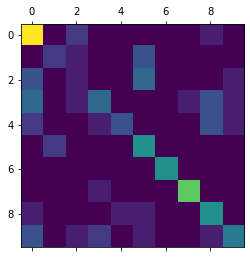

Confusion_matrix
 [[12  0  2  0  0  0  0  0  1  0]
 [ 0  2  1  0  0  3  0  0  0  0]
 [ 3  0  1  0  0  4  0  0  0  1]
 [ 4  0  1  4  0  0  0  1  3  1]
 [ 2  0  0  1  3  0  0  0  3  1]
 [ 0  2  0  0  0  6  0  0  0  0]
 [ 0  0  0  0  0  0  6  0  0  0]
 [ 0  0  0  1  0  0  0  9  0  0]
 [ 1  0  0  0  1  1  0  0  6  0]
 [ 3  0  1  2  0  1  0  0  1  5]]
Lowest Loss:0.005473734810948372 at epoch 88
Best Accuracy:0.54 at epoch 19


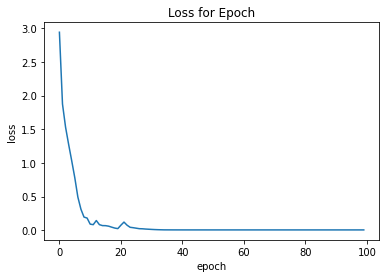

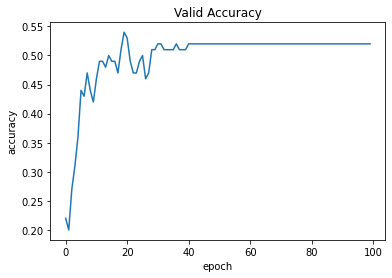

loss [2.9392240047454834, 1.8732939958572388, 1.5302188396453857, 1.2743308544158936, 1.0314910411834717, 0.7803245186805725, 0.49273961782455444, 0.31216251850128174, 0.19572220742702484, 0.18158762156963348, 0.09134083241224289, 0.08349616080522537, 0.1445372849702835, 0.08387158066034317, 0.06952005624771118, 0.06865090131759644, 0.06115700677037239, 0.046461187303066254, 0.032889705151319504, 0.024786988273262978, 0.07571032643318176, 0.121658094227314, 0.07560203224420547, 0.044386398047208786, 0.03831520676612854, 0.030957907438278198, 0.023713188245892525, 0.022164421156048775, 0.018362347036600113, 0.01562504656612873, 0.012962055392563343, 0.010556320659816265, 0.008856809698045254, 0.007505402900278568, 0.006378660444170237, 0.0061388155445456505, 0.005978523287922144, 0.005782268475741148, 0.005735394079238176, 0.005656056106090546, 0.005623266100883484, 0.005626654718071222, 0.005584364756941795, 0.005577759817242622, 0.005565390456467867, 0.005551351234316826, 0.0055506872

In [ ]:
evaluate(resnet, resnet_model, test_data, test_label)
print(f'Lowest Loss:{np.min(resnet_epoch_loss)} at epoch {np.argmin(resnet_epoch_loss)}\nBest Accuracy:{np.max(resnet_epoch_accuracy)} at epoch {np.argmax(resnet_epoch_accuracy)}')
plot_loss_accuracy(resnet_epoch_loss,resnet_epoch_accuracy, num_epochs)
print('loss',resnet_epoch_loss)
print('accuracy',resnet_epoch_accuracy)